In [0]:
# This notebook is for vector interpolation of latent space of our CGAN model

Import all the required libraries

In [0]:
#interpolating between generated faces
import os
from os import listdir
from numpy import asarray
from numpy import array
from numpy import vstack
from numpy.random import random
from numpy.random import randn
from numpy.random import randint
from numpy import linspace
from numpy.random import shuffle
from tensorflow.keras.models import load_model
from matplotlib import pyplot as plt
import numpy as np
import re
import tensorflow as tf
from tensorflow import get_logger as log

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
os.chdir("/content/drive/My Drive/deeplearning/")
!ls

In [0]:
qError = False
if qError:
    print("\n***REMEMBER:  WARNINGS turned OFF***\n***REMEMBER:  WARNINGS turned OFF***\n")
    log().setLevel('ERROR')

We can generate points in the latent space, perform the interpolation, then generate an image for each interpolated vector. The result will be a series of images that transition between the two original images. The example below demonstrates this for two faces.



In [0]:
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, cumProbs, n_classes=4):
    # print("generate_latent_points: ", latent_dim, n_samples)
    initX = -3.0
    rangeX = 2.0*abs(initX)
    stepX = rangeX / (latent_dim)
    for i in range(2*n_samples):
        x_input = asarray([initX + stepX*(float(i)) for i in range(0,latent_dim)])
        shuffle(x_input)
        if i == 0:
            xx_input = x_input
        else:
            xx_input = vstack((xx_input, x_input))
    z_input = xx_input.reshape(n_samples*2, latent_dim)
    labels = np.zeros(int(n_classes), dtype=int)
    return [z_input, labels]

we can create an interpolation path between two points in the latent space and generate faces along this path. The simplest interpolation we can use is a linear or uniform interpolation between two points in the latent space. We can achieve this using the linspace() NumPy function to calculate ratios of the contribution from two points, then enumerate these ratios and construct a vector for each ratio. The interpolate points() function below implements this and returns a series of linearly interpolated vectors between two points in latent space, including the first and last point.

In [0]:
# uniform interpolation between two points in latent space
def interpolate_points(p1, p2, n_steps=10):
    # interpolate ratios between the points
    ratios = linspace(0, 1, num=n_steps)
    # linear interpolate vectors
    vectors = list()
    for ratio in ratios:
        v = (1.0 - ratio) * p1 + ratio * p2
        vectors.append(v)
    return asarray(vectors)

In [0]:
# create a plot of generated images
def plot_generated(win_title, examples, labels, n, n_samples, n_classes):
    # plot images
    ii=-1
    for i in range(n_samples):
        for j in range(n_classes):
            strLabel = str(j%4)
            for j in range(n):
                ii+=1
                # define subplot
                plt.subplot(n_classes*n_samples, n, 1 + ii)
                # turn off axis
                plt.axis('off')
                plt.text(8.0,20.0,strLabel, fontsize=6, color='white')
                # plot raw pixel data
                plt.imshow(examples[ii, :, :])
    plt.gcf().canvas.set_window_title(win_title)
    (plt.gcf()).set_size_inches(12,10)
    save_directory = 'results/vector_interpolation_results/'
    plt.savefig(save_directory + win_title + '.png')
    plt.show()

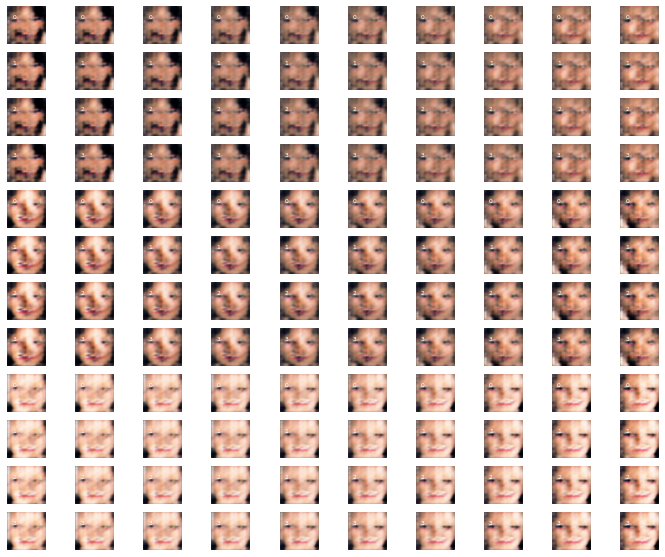

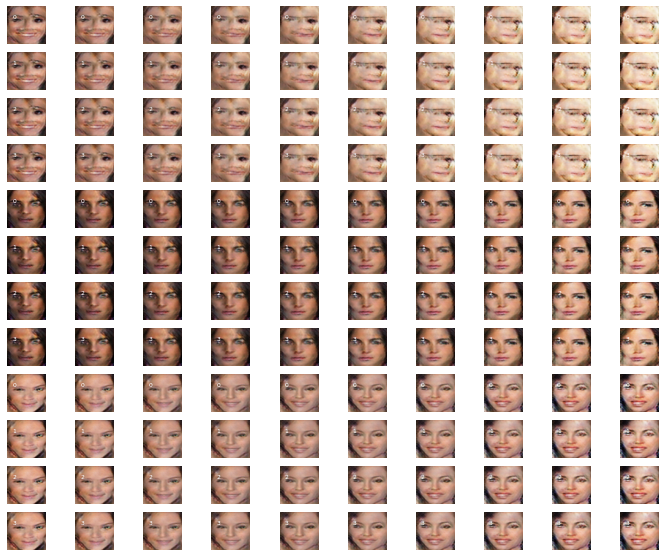

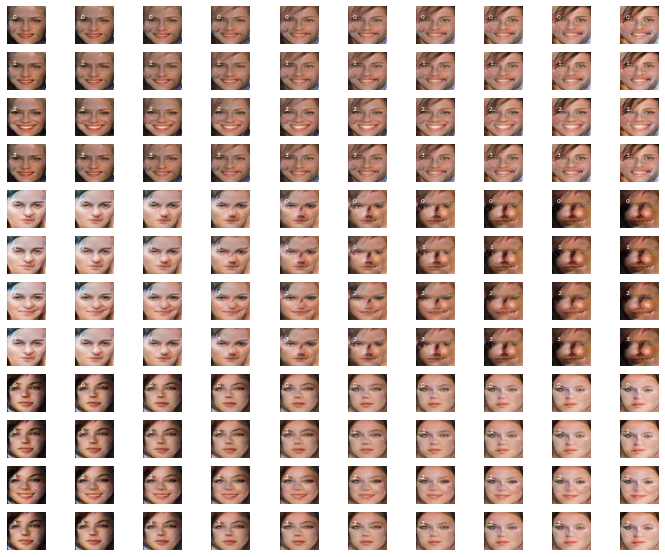

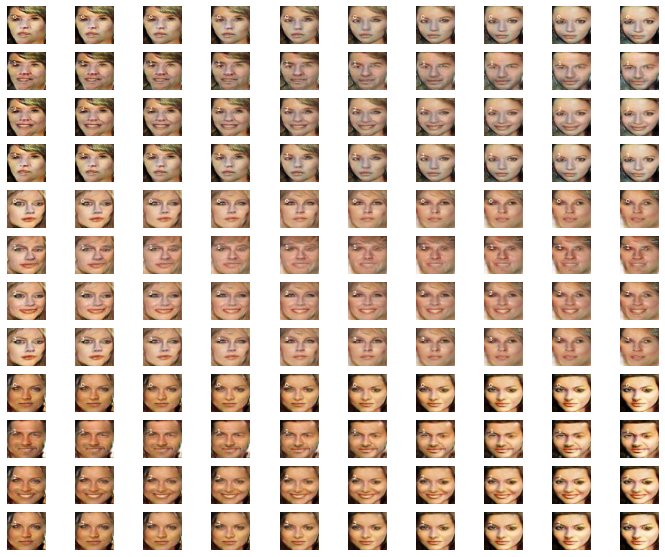

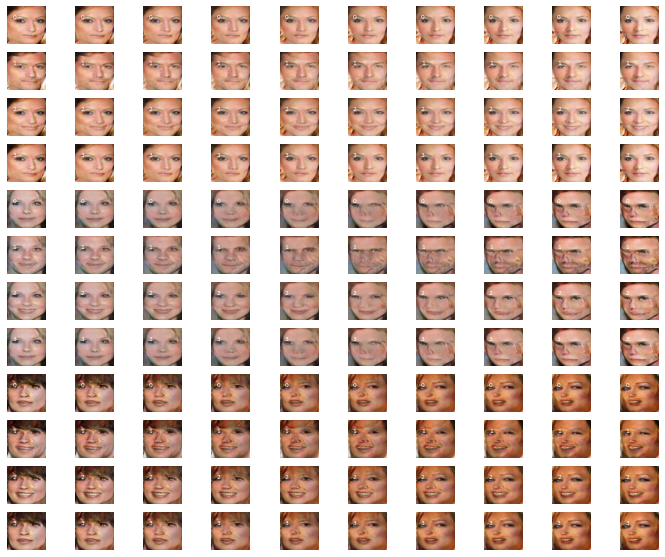

...

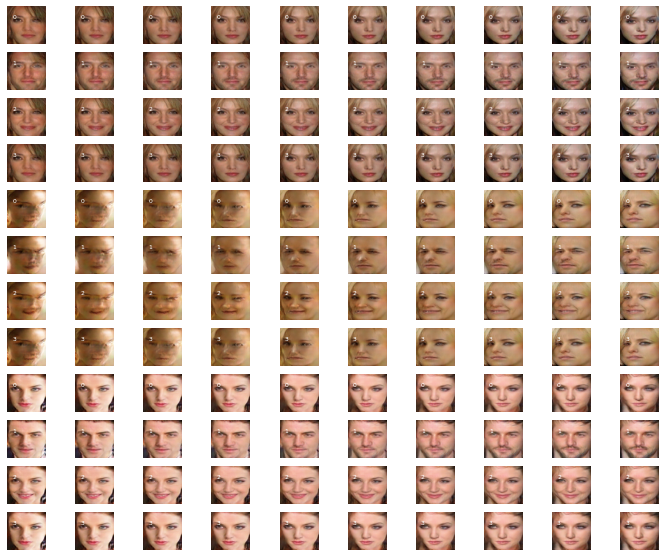

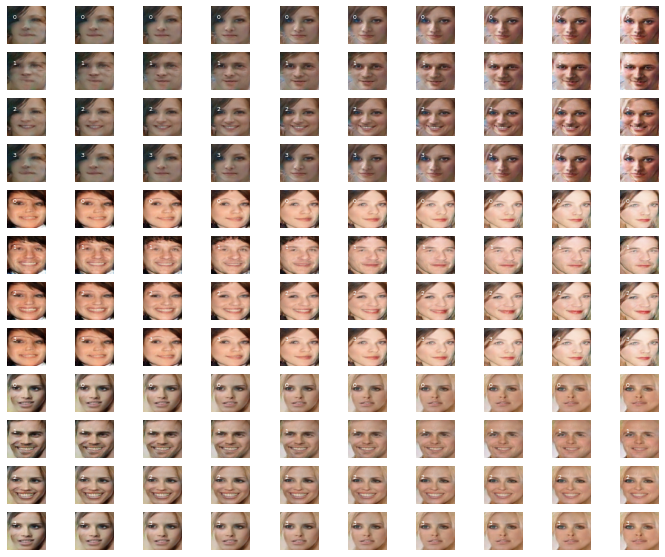

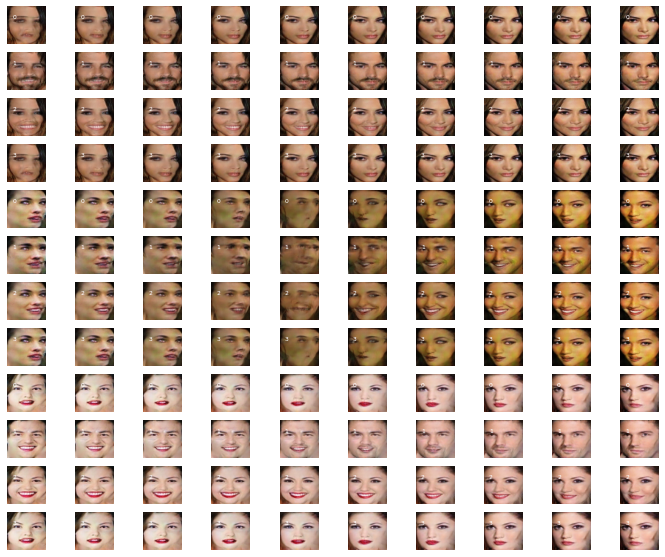

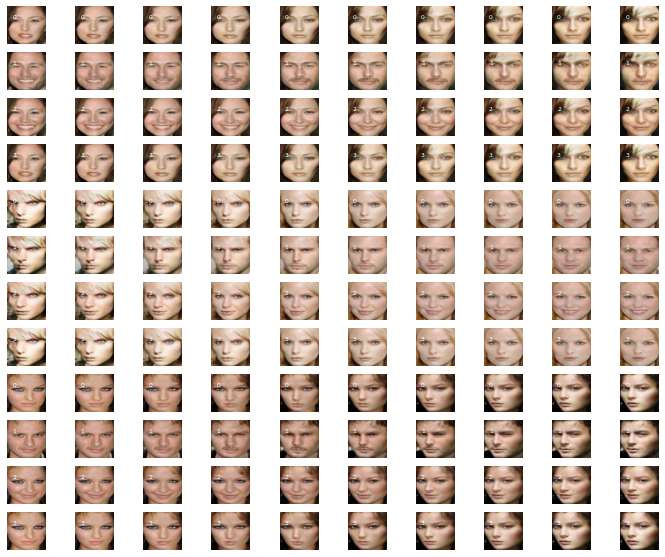

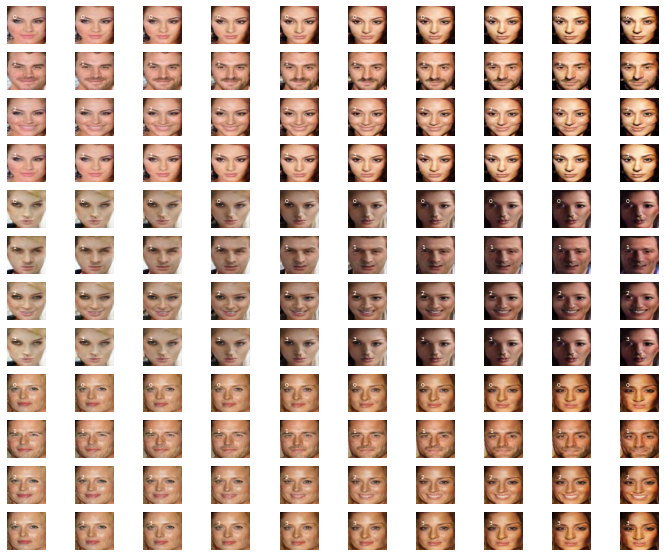

In [8]:
directory = 'results/models/'
lstEpochs = [5,15,25,35,45,55,65,75,85,95,105,115,125,135,145,155,165,175,185,195,200,205,215,225]
for idx, filename in enumerate(listdir(directory)):
    if ".h5" in filename and not("_gan" in filename) and not("_dis" in filename):
        iFile = int(re.findall(r'\d+',filename)[0])
        if iFile in lstEpochs: 
            model = load_model(directory + filename)
            gen_weights = array(model.get_weights())
            n_samples = 3
            n_classes = 4
            cumProbs = [0., 0.21328001, 0.4402, 0.89390001, 1.0000000]
            latent_dim = 100
            pts, labels_input = generate_latent_points(latent_dim, n_samples, cumProbs)
            # interpolate pairs
            results = None
            for i in range(n_samples):            # interpolate points in latent space
                interpolated = interpolate_points(pts[2*i], pts[2*i+1])
                for j in range(n_classes):
                    labels = np.ones(10,dtype=int)*j
                    X = model.predict([interpolated, labels])
                    # scale from [-1,1] to [0,1]
                    X = (X + 1) / 2.0
                    if results is None:
                        results = X
                    else:
                        results = vstack((results, X))
            # plot the result
            plot_generated(filename, results, labels_input, 10, n_samples, n_classes)